# <b>EasySQ Demo 2</b>

## Demo 2 follows ["this"](https://squidpy.readthedocs.io/en/stable/notebooks/tutorials/tutorial_vizgen_mouse_liver.html) Squidpy tutorial on analyzing vizgen data.

### What does this demo cover?

This demo continues with the analysis of vizgen data. This time, it uses a mouse liver instead of brain. We will look at clustering, expression, filtering, and a variety of other useful tools.

#### For more information regarding any of the functions used below, see the corresponding [Squidpy documentation](https://squidpy.readthedocs.io/en/stable/api.html#).

### Import the files/libraries for use in this demo.

We ignore the warnings in this notebook for readability, but you should enable them in your project.

In [1]:
import warnings
warnings.filterwarnings('ignore')

import time
import os
import EasySQ as esq
from copy import deepcopy

### Downloading and importing the data.

Just like before, we are going to download the data and import it using EasySQ.

We will use the Liver1Slice1 dataset from Vizgen’s MERFISH Mouse Liver Map:<br>
https://info.vizgen.com/mouse-liver-access.<br>

#### Accessing the data.

<ol>
    <li>Complete the registration.</li>
    <li>Click on "Access Full Dataset" further down the page.</li>
    <li>Select folder <code>liver1slice1</code> in the Google Cloud that opens.</li>
    <li>Download <code>cell_by_gene.csv</code> and <code>cell_metadata.csv</code>.</li>
    <li>In your project, create a directory called <code>tutorial_data_2</code></li>
    <li>Place the files you downloaded into the directory you just created.</li>
</ol>

Now that you have setup your project structure, we can start a timer and import the data. Look at <code>In [5]:</code> for how to do this.<br>
<code>path</code> is the path to the directory that contains your data.<br>
<code>esqAn = esq.Analysis(data_path=path)</code> creates a new Analysis class object and passes in the path.<br>
<code>Analysis</code> searches that directory for files which include <code>cell_metadata</code> and <code>cell_by_gene</code> in their names.<br>
It then imports those files and creates a new AnnData object for use in the analysis.

In [2]:
    t0 = time.time()  # start timer

    path = os.getcwd() + '/tutorial_data_2/'
    esqAn = esq.Analysis(data_path=path)
    esqAn.print()


OBJECT INFO
object: <EasySQ.Analysis object at 0x000001BC734BD840>
object ID: 590Q260CT

DATA
 data path: C:\Users\scrouse2\Crouse_Work_Files\Documentation\EasySQ/tutorial_data_2/
 adata:
 AnnData object with n_obs × n_vars = 395215 × 347
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'



### Set the leiden palette.

Set the leiden palette colors so we can have consistent coloring.
These come from the colors directory provided in the github repo.

In [3]:
    esqAn.setLeidenColors("leiden_generated_random_5.txt");

setting leiden colors


### Calculating the quality control metrics for our AnnData.

Here we will make the variable names unique, calculate qc metrics using scanpy and return the percent of genes unassigned.

In [4]:
    esqAn.qcMetrics(percentTop=(50, 100, 200, 300))

0.5514871329069138

### Filter cells and genes.

Filter cell outliers based on counts and numbers of genes expressed.<br>
Then, filter genes based on the number of cells or counts.

In [5]:
    esqAn.filterCells(minCounts=50)
    esqAn.filterGenes(minCells=10)

### Normalizing, transforming, and scaling the data.

We are going to normalize the data using <code>esqAn.normalizeTotal()</code>. This normalizes the counts per cells.<br>
Then, we are going to logarithmize the data matrix using <code>esqAn.log1p()</code>.<br>
Finally, we are going to scale the data to unit variance and zero mean using <code>esqAn.scale()</code>.

In [6]:
    print("normalize total")
    esqAn.normalizeTotal()
    
    print("log transform")
    esqAn.log1p()
    
    print("scale")
    esqAn.scale(maxValue=10)

normalize total
log transform
scale


### Principle component analysis, neighborhood graph computation, UMAP data calculation, and leiden cluster creation at a resolution of 1.5.

Here we are going to run a few of the main calculations for our analysis. We start with a principle component analysis. This function <code>esqAn.tl_pca()</code> calculates the PCA.<br>
Then we will compute the neighborhood graph based on the observations. <code>esqAn.pp_neighbors()</code> does this.<br>
<code>esqAn.tl_umap()</code> calculates the UMAP data, but it doesn't plot it.<br>
Lastly, the leiden function, <code>esqAn.leiden(resolution=resolution)</code> calculates the leiden clusters using the given resolution.

In [7]:
    resolution = 1.5
    print("PCA")
    esqAn.tl_pca()
    print("neighbors")
    esqAn.pp_neighbors(nNeighbors=10, nPcs=20)
    print("UMAP")
    esqAn.tl_umap()
    print("leiden")
    esqAn.leiden(resolution=resolution)

PCA
neighbors
UMAP
leiden


### Plot the UMAP data.

To plot the UMAP data we are going to use the <code>esqAn.pl_umap()</code> function. If you look at the prefix used on the various functions, you may see that tl, pp, and pl are used, among others. "pl" is generally used to denote a function that will produce a plot. We can show these plots using <code>esqAn.showPlots()</code> when we may not be using a jupyter notebook.<br><br>

The graphs paramater is used to decide which graphs and which types of graphs to plot. We can use <code>esqAn.availableGraphs()</code> to see which graphs are currently available to plot using <code>esqAn.spatialScatter()</code> or <code>esqAn.pl_umap()</code>

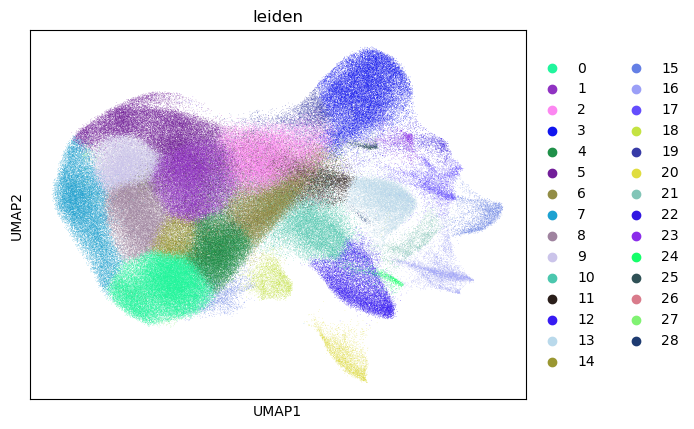

In [8]:
    esqAn.pl_umap(graphs=["leiden"], size=0.5)

In [9]:
    esqAn.availableGraphs();  # the semi-colon at the end of this line preventents jupyter from printing the return value, which are all of the graphs in a list of strings.

AVAILABLE GRAPHS:
 Pass any of these to spatialScatter() to plot!
 Genes: ['Comt', 'Ldha', 'Pck1', 'Akr1a1', 'Ugt2b1', 'Acsl5', 'Ugt2a3', 'Igf1', 'Errfi1', 'Serping1', 'Adh4', 'Hsd17b2', 'Tpi1', 'Cyp1a2', 'Acsl1', 'Akr1d1', 'Alas1', 'Aldh7a1', 'G6pc', 'Hsd17b12', 'Pdhb', 'Gpd1', 'Cyp7b1', 'Pgam1', 'Hc', 'Dld', 'Cyp2c23', 'Proz', 'Acss2', 'Psap', 'Cald1', 'Hsd3b3', 'Galm', 'Cxcl12', 'Sardh', 'Cebpa', 'Aldh3a2', 'Gck', 'Sdc1', 'Pdha1', 'Npc2', 'Hsd17b6', 'Aqp1', 'Adh7', 'Smpdl3a', 'Egfr', 'Pgm1', 'Fasn', 'Ctsc', 'Abcb4', 'Fyb', 'Alas2', 'Gpi1', 'Fech', 'Lsr', 'Psmd3', 'Gm2a', 'Pabpc1', 'Cbr4', 'Tkt', 'Tmem56', 'Eif3f', 'Cxadr', 'Srd5a1', 'Cyp2c55', 'Gnai2', 'Gimap6', 'Hsd3b2', 'Grn', 'Rpp14', 'Csnk1a1', 'Egr1', 'Mpeg1', 'Acsl4', 'Hmgb1', 'Mpp1', 'Lcp1', 'Plvap', 'Aldh1b1', 'Oxsm', 'Dlat', 'Csk', 'Mcat', 'Hsd17b7', 'Epas1', 'Eif3a', 'Nrp1', 'Dek', 'H2afy', 'Bpgm', 'Hsd3b6', 'Dnase1l3', 'Serpinh1', 'Tinagl1', 'Aldoc', 'Cyp2c38', 'Dpt', 'Mrc1', 'Minpp1', 'Fgf1', 'Alcam', 'Gimap4', 'Cav2', '

As you can see, there are a lot of available graphs. The genes section of available graphs shows which genes we can graph. The analyses section shows which graphs are available that describe the current data. An example of a gene graph is, <code>Tmod1</code> and <code>pct_counts_in_top_150_genes</code>.<br>

Let's plot these now.

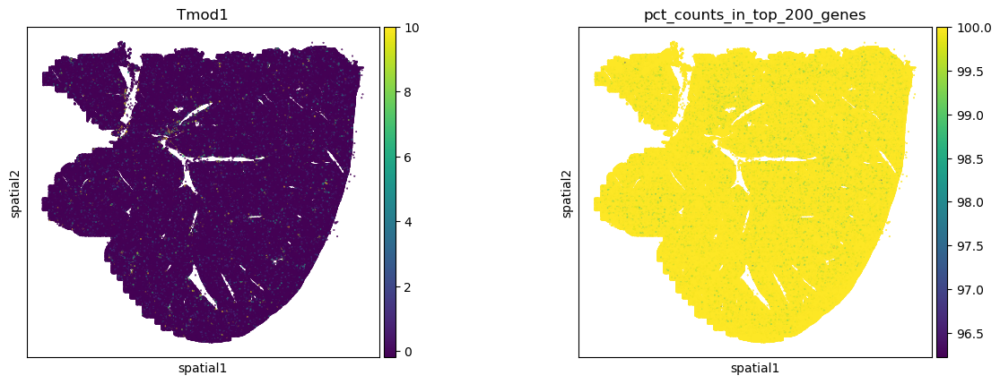

In [10]:
esqAn.spatialScatter(graphs=["Tmod1", "pct_counts_in_top_200_genes"])

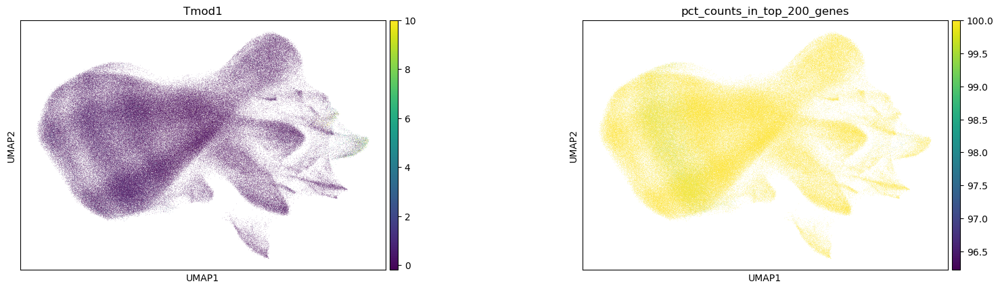

In [11]:
esqAn.pl_umap(graphs=["Tmod1", "pct_counts_in_top_200_genes"])

As you can see, we can use the <code>esqAn.availableGraphs()</code> function to easily plot different expressions and analyses using <code>esqAn.spatialScatter()</code> or <code>esqAn.pl_umap()</code><br>
The difference between these two being that the spatial scatter plots them based on their positions, whereas the UMAP plots them based on relative position.<br>

"Broadly speaking, the UMAP algorithm learns the underlying manifold, or shape, of a high-dimensional dataset to place similar cells together in a low-dimensional plot." from ["this"](https://www.scdiscoveries.com/blog/knowledge/what-is-a-umap-plot/) website. Visit it if you'd like to learn more about UMAPs.

#### Leiden Spatial Scatter

The last graph we will produce before moving on is the leiden clusters spatial scatter. We will also use the spatial data that was created earlier and stored in <code>libraryID="spatial"</code>. You do not need a <code>libraryID</code> to spatial scatter, however. This code will also work without it. Take a look at the Squidpy documentation to see why the <code>libraryID</code> is used.

leiden colors are None, closing graph and running an init. VALUE ERROR
running leiden color init
Too many colors in palette! Automatically reducing size now!
setting leiden colors


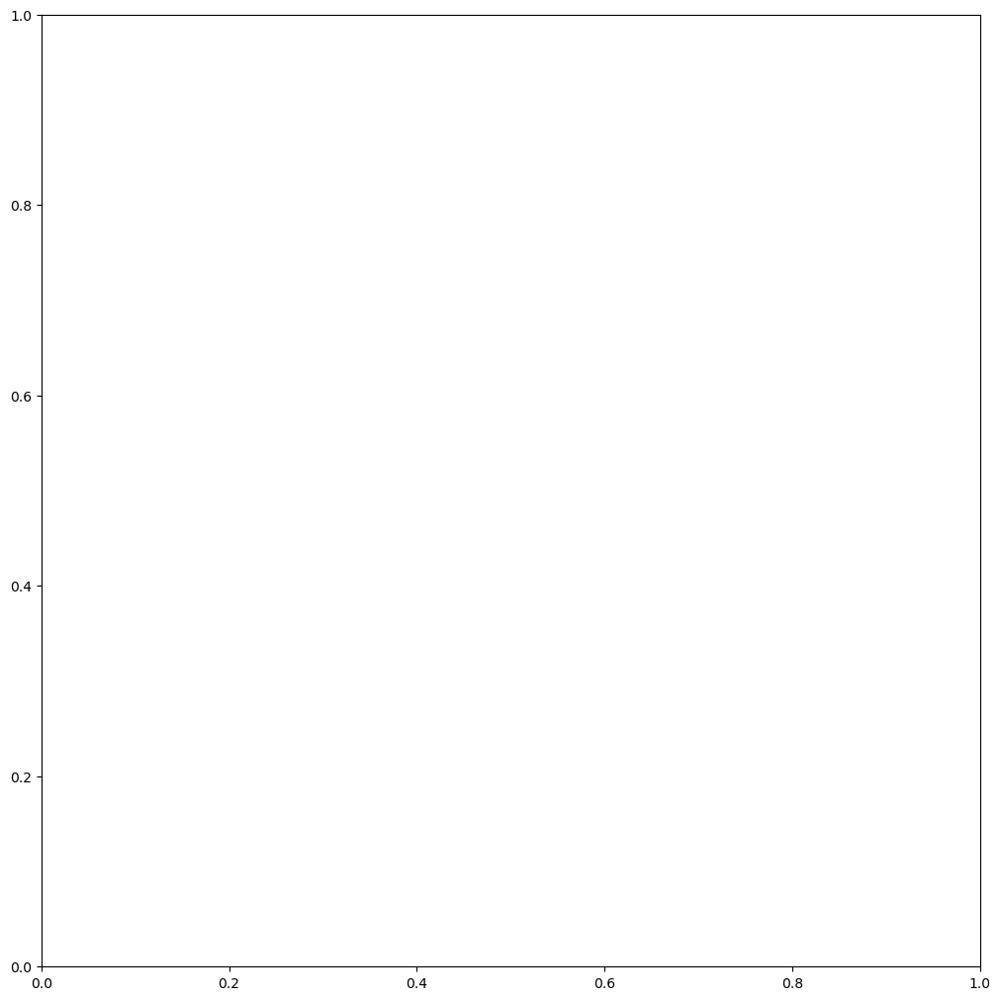

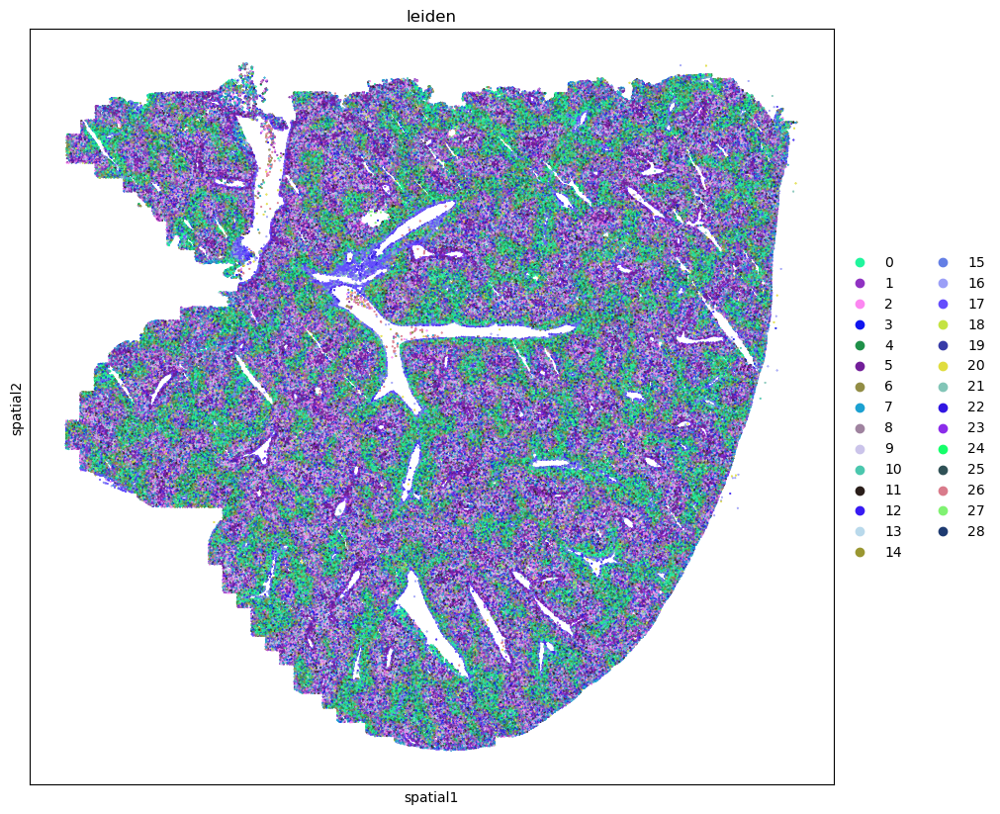

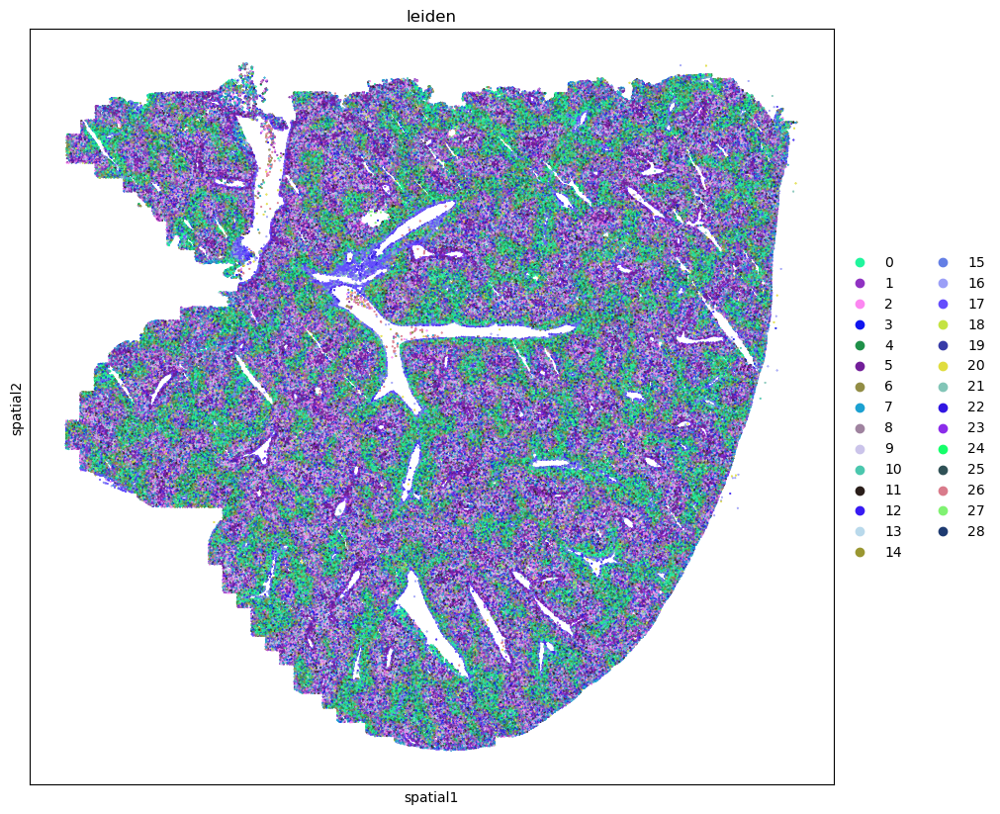

In [12]:
    figsize=(10, 10)
    esqAn.spatialScatter(graphs=["leiden"], libraryID="spatial", figsize=figsize, size=0.5)
    esqAn.spatialScatter(graphs=["leiden"], figsize=figsize, size=0.5)

### Assigning Reference Cell Type Marker Gene Sets

The process of assigning reference panels is simplified in EasySQ. This is done through the following three functions.<br>
<ol>
    <li><code>esqAn.assignReferenceCells()</code></li>
    <li><code>esqAn.calculateLeidenExpressionSignatures()</code></li>
    <li><code>esqAn.assignCellTypesOnExpression()</code></li>
</ol>

Firstly, we get the reference panel using <code>esqAn.assignReferenceCells()</code>. The default panel gets from [here](https://static-content.springer.com/esm/art%3A10.1038%2Fs41421-021-00266-1/MediaObjects/41421_2021_266_MOESM1_ESM.xlsx), which is the default provided by the Squidpy demo. However, you can override this panel with your own using the <code>gene_panel_url</code> paramater in the function. <code>esqAn.assignReferenceCells(gene_panel_url="https://static-content.springer.com/esm/art%3A10.1038%2Fs41421-021-00266-1/MediaObjects/41421_2021_266_MOESM1_ESM.xlsx")</code>.<br>

Then we calculate the leiden signatures so that we can accurately assign cell types. This is done using <code>esqAn.calculateLeidenExpressionSignatures()</code>.<br>
Then, assign the cells types using <code>esqAn.assignCellTypesOnExpress()</code>.

In [13]:
    print("Get and Assign Cell Types")
    esqAn.assignReferenceCells()

    print("Calculate Leiden Cluster Average Expression Signatures")
    esqAn.calculateLeidenExpressionSignatures()

    print("Assign Cell Type Based on Top Expressed Marker Genes")
    esqAn.assignCellTypesOnExpression()

Get and Assign Cell Types
Markers
N.A.                            285
HSC marker                        8
Hepatocyte marker                 5
Erythroid progenitor marker       5
Macrophage marker                 5
SEC marker                        5
Neutrophil marker                 5
MK marker                         5
Potential HSC marker              5
Pre-B cell marker                 5
Erythroid cell marker             4
EC marker                         4
AEC marker                        2
Myeloid marker                    2
Macrophage/Hepatocyte marker      1
Basophil marker                   1
Name: count, dtype: int64
Calculate Leiden Cluster Average Expression Signatures
Assign Cell Type Based on Top Expressed Marker Genes
Leiden-0 Hepatocyte
Leiden-1 Hepatocyte
Leiden-2 SEC
Leiden-3 SEC
Leiden-4 Hepatocyte
Leiden-5 Hepatocyte
Leiden-6 Hepatocyte_SEC
Leiden-7 Hepatocyte
Leiden-8 Hepatocyte
Leiden-9 Hepatocyte
Leiden-10 Macrophage
Leiden-11 AEC
Leiden-12 Macrophage
Leiden-13 

### Graph the Hepatocyte zonation that is done in the Vizgen Mouse Liver Squidpy demo.

The Squidpy demo uses <code>spatial_scatter()</code> to graph the zonation. We will use <code>esqAn.spatialScatter()</code> to do this. They do the same thing, but <code>esqAn.spatialScatter()</code> does so in a more digestible format that tracks the analysis object for us. This is an example of transforming Squidpy code to EasySQ code. To learn more about using Squidpy and EasySQ in tandem, follow the "EasySQ Squidpy Interface.ipynb" tutorial. This demo won't display the original code in this notebook, only the converted code. If you want to compare it, look at the original Squidpy Vizgen Mouse Liver Demo.

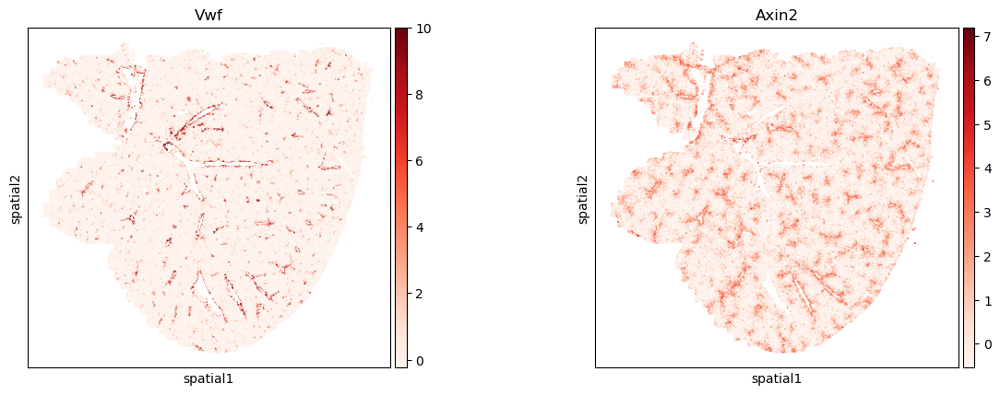

In [14]:
# sq.pl.spatial_scatter(adata, color=["Vwf", "Axin2"], size=15, cmap="Reds", img=False, figsize=(12, 8))
esqAn.spatialScatter(graphs=["Vwf", "Axin2"], cmap="Reds")

### Distinguishing peri-portal and peri-central hepatocytes.
.
Here we define the hepatocyte clusters using the meta leiden and sig leiden values that were created earlier at "In [14]:." Then, we setup the sig leiden columns and define the ser_axin2 gene. Using this we determine whether it is peri-central or peri-portal and set the variables respectively. Finally, we plot both of the graphs using <code>esqAn.spatialScatter()</code> and pass the <code>peri_central</code> and <code>peri_portal</code> variables to the groups paramater so that it knows which genes to graph.

In [15]:
all_hepatocyte_clusters = [x for x in esqAn.getMetaLeiden().index.tolist() if "Hepatocyte" in x]
esqAn.getSigLeiden().columns = esqAn.getMetaLeiden().index.tolist()
ser_axin2 = esqAn.getSigLeiden()[all_hepatocyte_clusters].loc["Axin2"]
peri_central = ser_axin2[ser_axin2 > 0].index.tolist()
peri_portal = ser_axin2[ser_axin2 <= 0].index.tolist()

#### Plot peri-central hepatocytes.

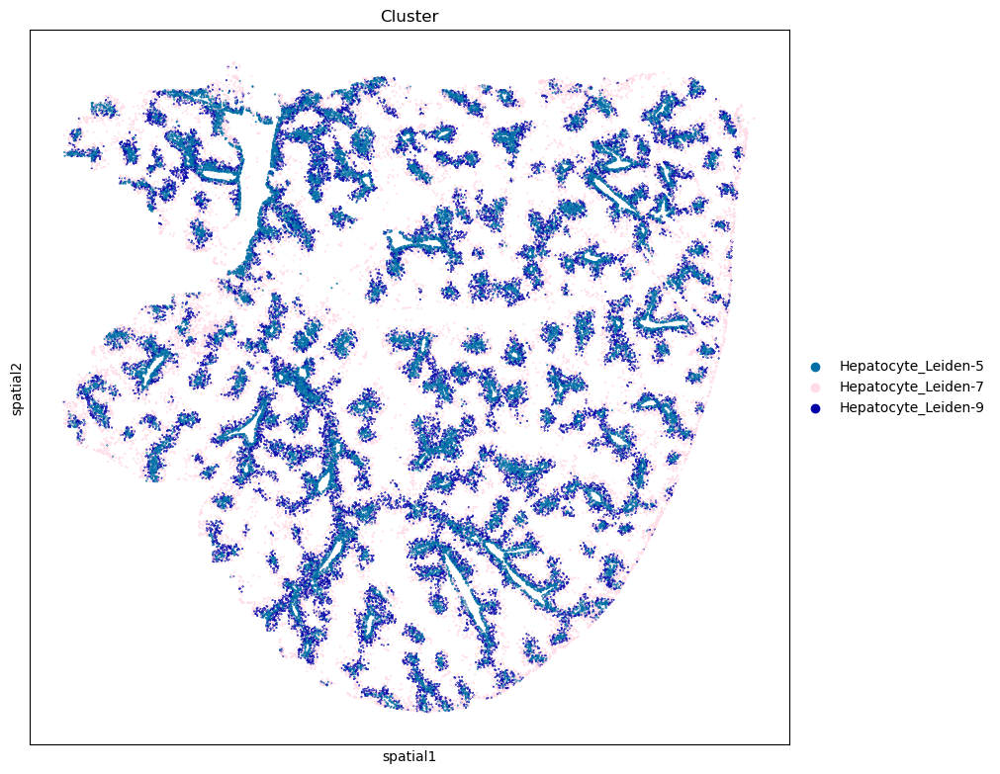

In [16]:
esqAn.spatialScatter(groups=peri_central, graphs=["Cluster"], figsize=(10, 10))

#### Plot peri-portal hepatocytes.

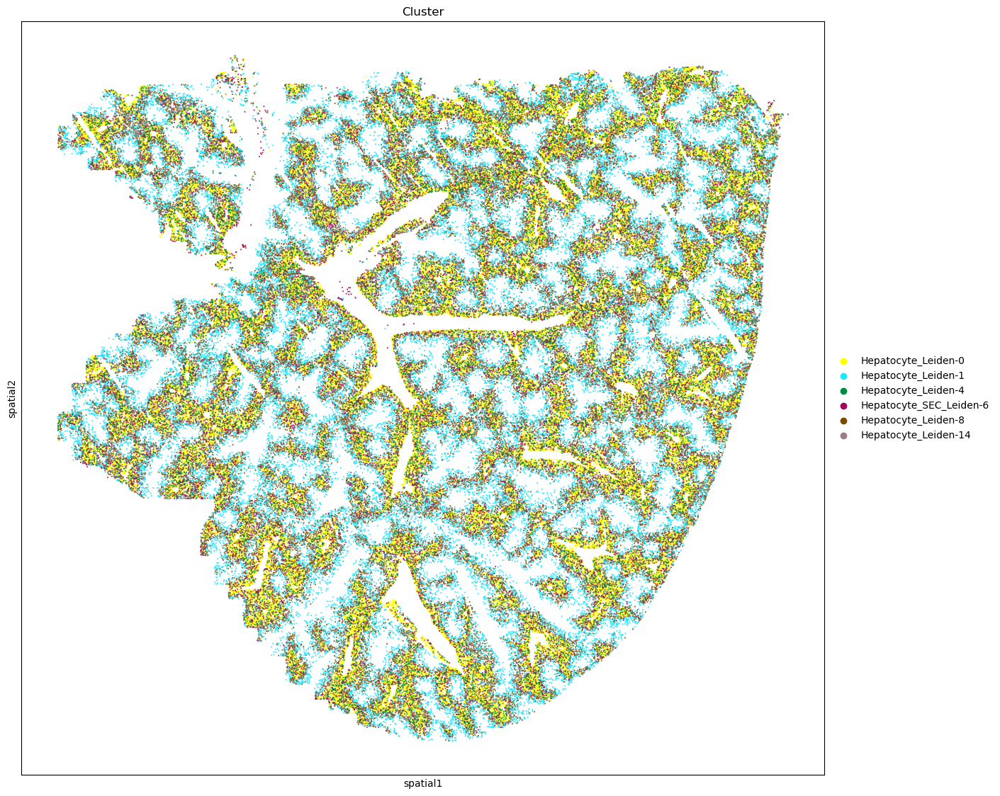

In [17]:
esqAn.spatialScatter(groups=peri_portal, graphs=["Cluster"], figsize=(14, 14))

### Neighborhood Enrichment

Using neighborhood enrichment, we can tell if clusters are close to each other more often than expected.<br>
Then we visualize these patterns using an inferno heat map.

Neighborhood Enrichment


  0%|          | 0/1000 [00:00<?, ?/s]

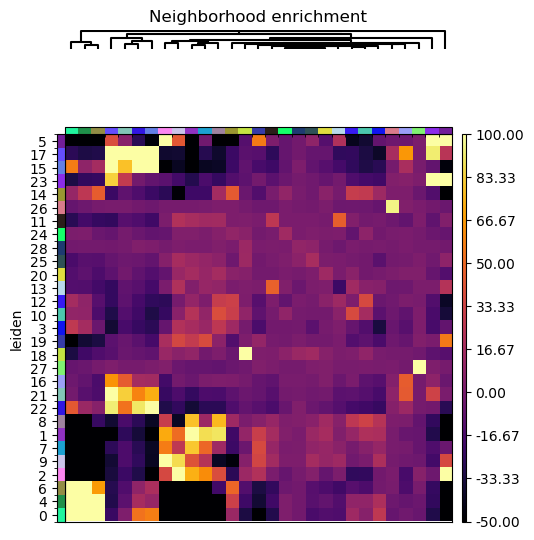

In [18]:
    print("Neighborhood Enrichment")
    esqAn.gr_spatialNeighbors()
    esqAn.gr_nhoodEnrichment()
    esqAn.pl_nhoodEnrichment(vmin=-50, vmax=100)

### Neighborhood Enrichment Clusters

Here we visualize the clusters from our neighborhood enrichment data.<br>
For each of the clusters available, we will run a spatial scatter that plots each of the cluster groups.

Neighborhood Enrichment Clusters


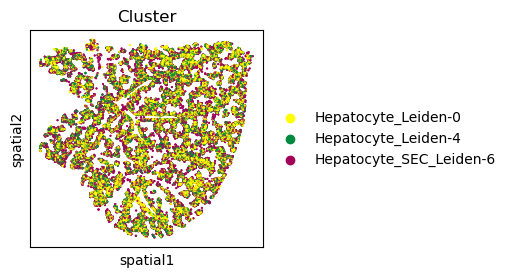

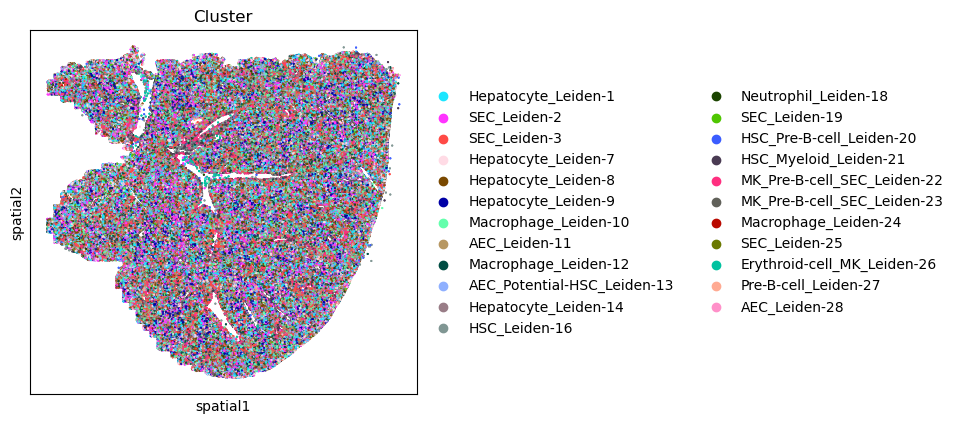

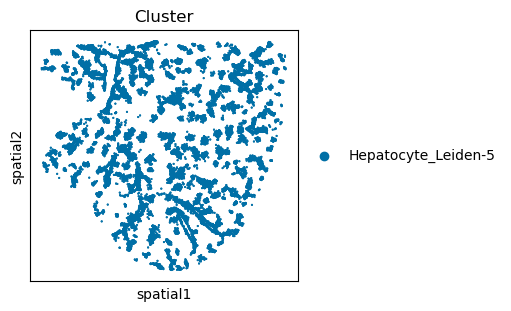

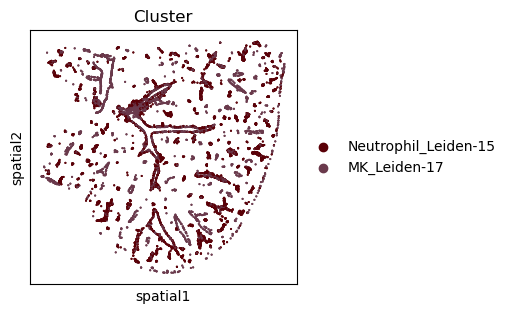

In [19]:
    print("Neighborhood Enrichment Clusters")
    esqAn.plotNHoodEnrichmentClusters(size=1)

### Network Centrality Scores

Here we calculate network-based centrality scores for the Leiden clusters. These include:<br>

<ol>
    <li>Closeness Centrality: How close a group is to other nodes.</li>
    <li>Degree Centrality: Fraction of connected non-group members.</li>
    <li>Clustering Coeffeicient: Measure of the degree to which nodes cluster.</li>
</ol>
        

Network Centrality Scores
High Closeness Score
Low Closeness Score
High Degree Centrality
Low Degree Centrality
High Clustering Coefficient
Low Clustering Coefficient


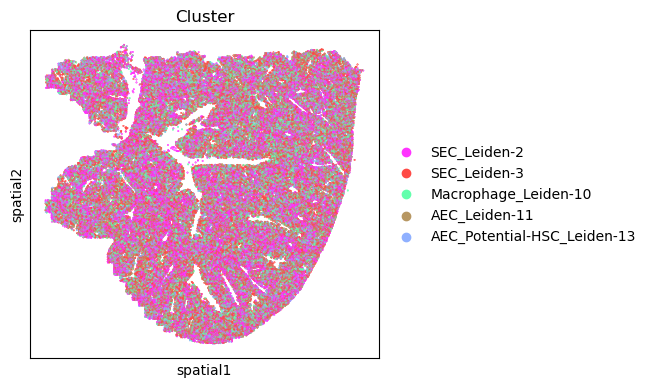

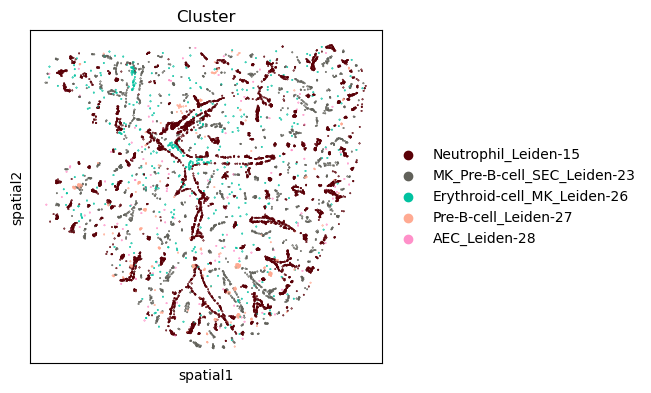

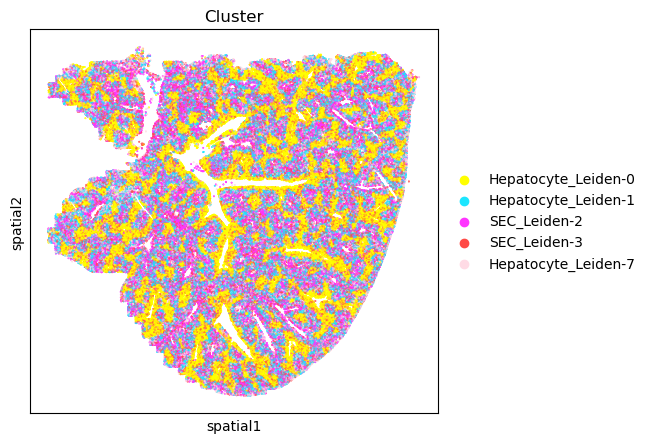

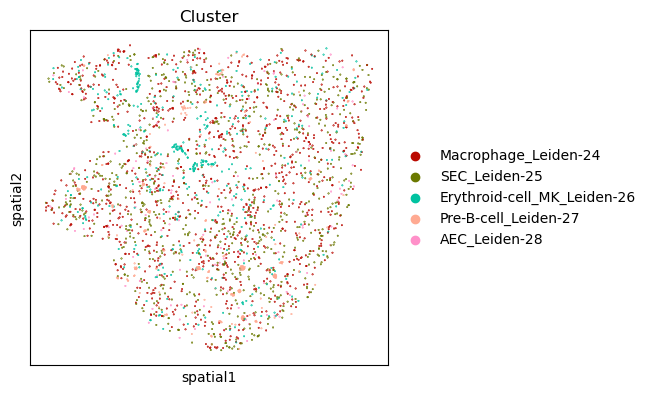

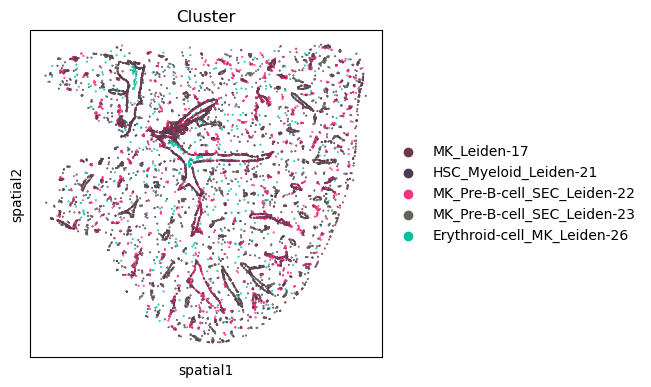

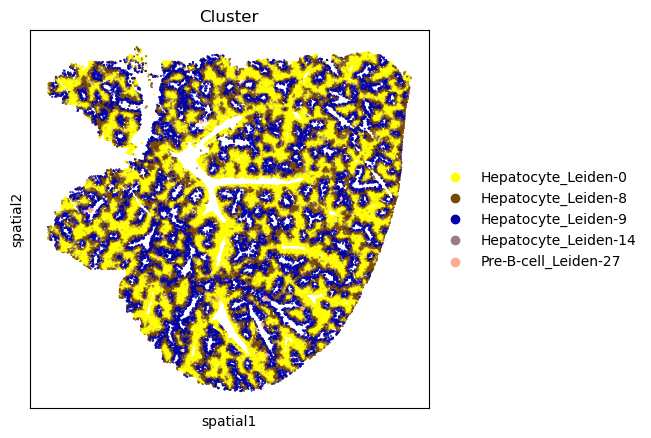

In [20]:
    print("Network Centrality Scores")
    esqAn.gr_centralityScores()
    
    
    esqAn.setDfCentral(deepcopy(esqAn.getAdata().uns["leiden_centrality_scores"]))
    esqAn.getDfCentral().index = esqAn.getMetaLeiden().index.tolist()

    # sort clusters based on centrality scores
    # closeness centrality - measure of how close the group is to other nodes.
    esqAn.calcSerCloseness()

    # degree centrality - fraction of non-group members connected to group members.
    esqAn.calcSerDegree()

    # clustering coefficient - measure of the degree to which nodes cluster together.
    esqAn.calcSerCluster()

    print("High Closeness Score")
    esqAn.highClosenessScore()

    print("Low Closeness Score")
    esqAn.lowClosenessScore()

    print("High Degree Centrality")
    esqAn.highDegreeCentrality()

    print("Low Degree Centrality")
    esqAn.lowDegreeCentrality()

    print("High Clustering Coefficient")
    esqAn.highClusteringCoefficient()

    print("Low Clustering Coefficient")
    esqAn.lowClusteringCoefficient()

### Autocorrelation: Moran's I Score

The calculation of Moran's I score runs spatial autocorrelation on the adata. It then sorts those values to produce top and bot autocorrelation values.<br>
We then plot these values in <code>esqAn.plotMoransIScore()</code> using spatial scatter and a red cmap.

Autocorrelation: Moran's I Score


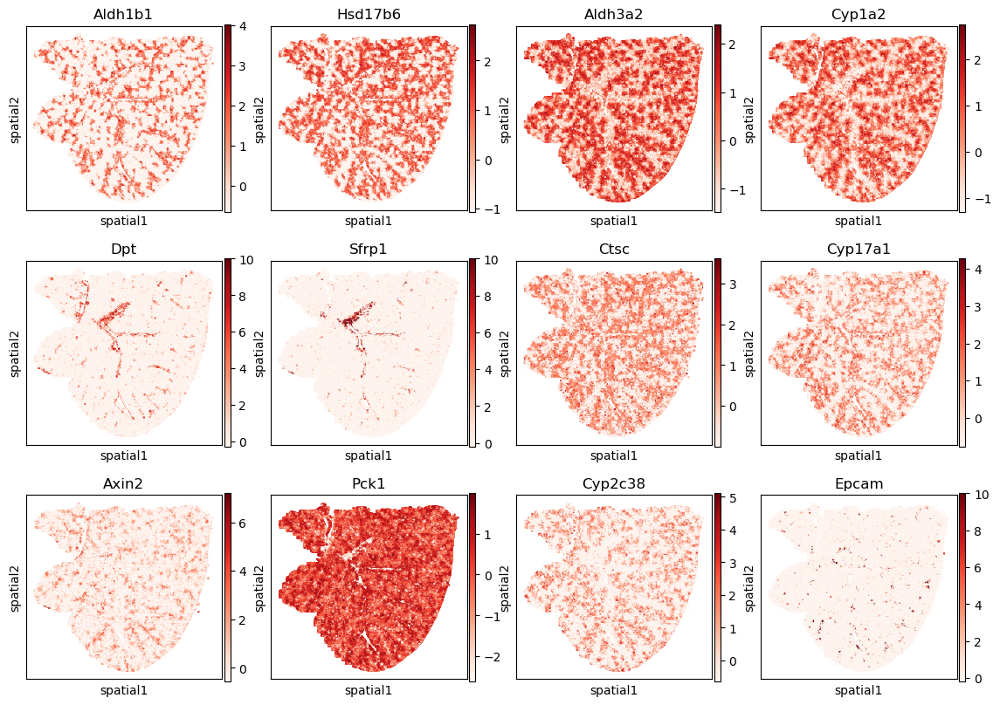

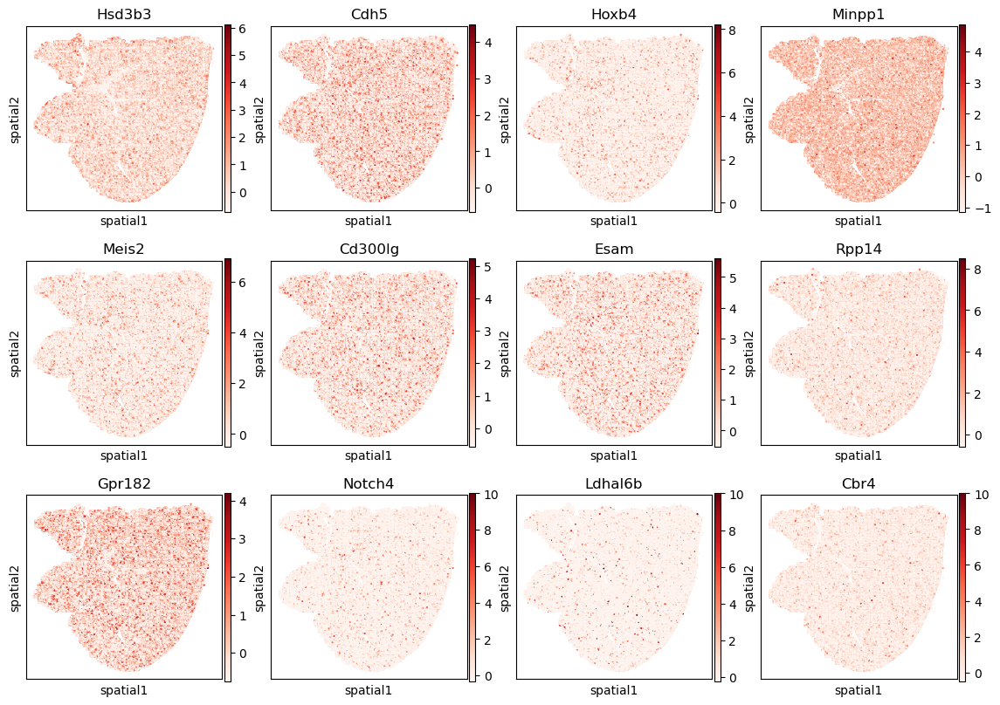

In [21]:
    print("Autocorrelation: Moran's I Score")
    esqAn.calcMoransIScore(numView=12)
    esqAn.plotMoransIScore(size=1, figsize=(3, 3))

### End timer and show plots.

End the timer and print the elapsed time. Then, show any plots that haven't yet been shown.

In [22]:
    t1 = time.time()  # end timer
    totalTime = t1 - t0
    print("time elapsed: {}".format(totalTime))

    esqAn.showPlots()

time elapsed: 1589.6168627738953
